In [1]:
# !/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
Created on Mon Mar 7 16:43:03 2022

@author: victor
"""

import cv2 
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os
from os import listdir
from os.path import isfile, join
import matplotlib
import matplotlib.pyplot as plt
import random
import json

%matplotlib inline

RED = (255,0,0)
PRINT_GREEN = '\033[92m'
PRINT_CYAN = '\033[96m'
PRINT_RED = '\033[91m'
PRINT_NORMAL = '\033[0m'
EXEC_ALL = 0
NUM_KP = 10

In [2]:
def leeimagen(fileName, flagColor):
    # Leer imagen
    imagen = cv2.imread('imagenes/' + fileName)
  
    if(flagColor == 1):
        imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB)
    elif(flagColor == 0):
        imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)

    return imagen

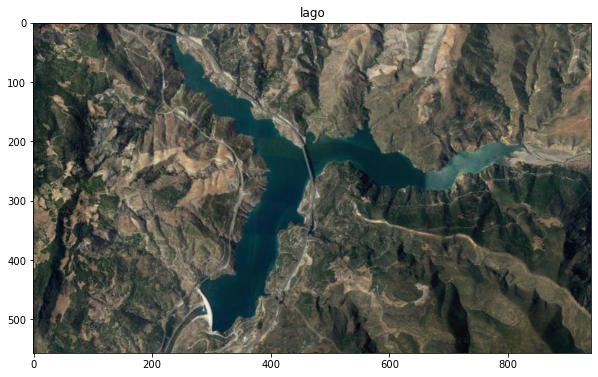

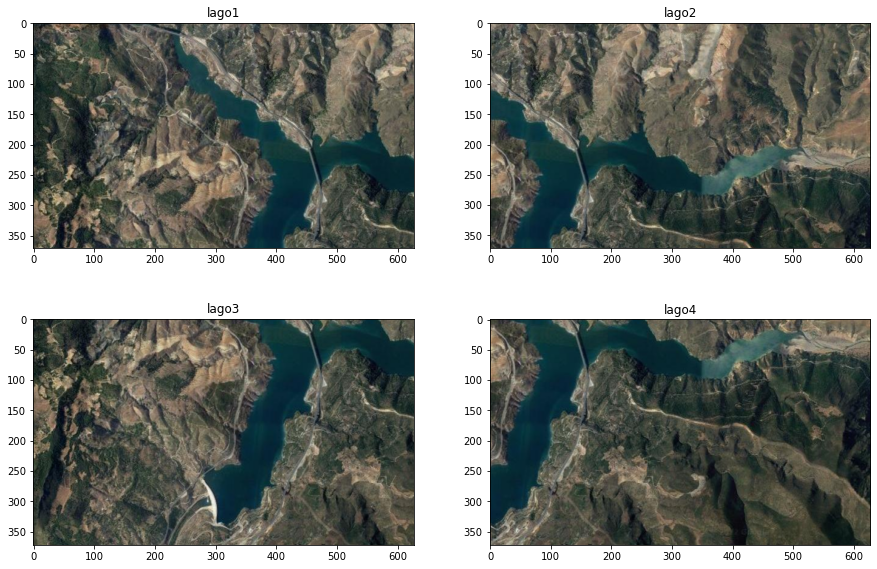

In [3]:
#leo imagen
lago = leeimagen('lago.png', 1)

# fragmento imagen
lago1 = lago[0:int(lago.shape[0]*2/3), 0:int(lago.shape[1]*2/3)]
lago2 = lago[0:int(lago.shape[0]*2/3), int(lago.shape[1]/3):]
lago3 = lago[int(lago.shape[0]/3):, 0:int(lago.shape[1]*2/3)]
lago4 = lago[int(lago.shape[0]/3):, int(lago.shape[1]/3):]

# Muestro resultados
fig = plt.figure(figsize=(10,10))
plt.title("lago")
plt.imshow(lago, cmap="gray")
plt.show()

fig = plt.figure(figsize=(15,10))
ax = plt.subplot(2, 2, 1)
ax.set_title("lago1")
ax.imshow(lago1, cmap='gray')

ax = plt.subplot(2, 2, 2)
ax.set_title("lago2")
ax.imshow(lago2, cmap='gray')

ax = plt.subplot(2, 2, 3)
ax.set_title("lago3")
ax.imshow(lago3, cmap='gray')

ax = plt.subplot(2, 2, 4)
ax.set_title("lago4")
ax.imshow(lago4, cmap='gray')
plt.show()

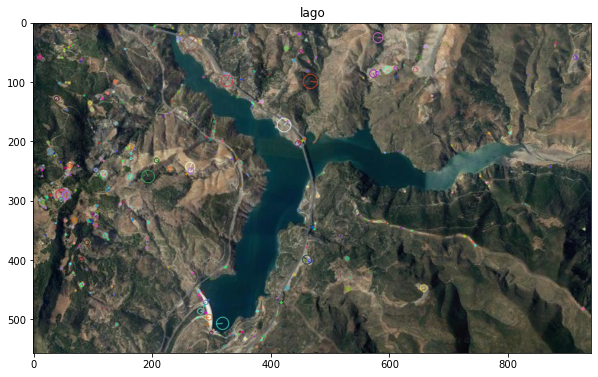

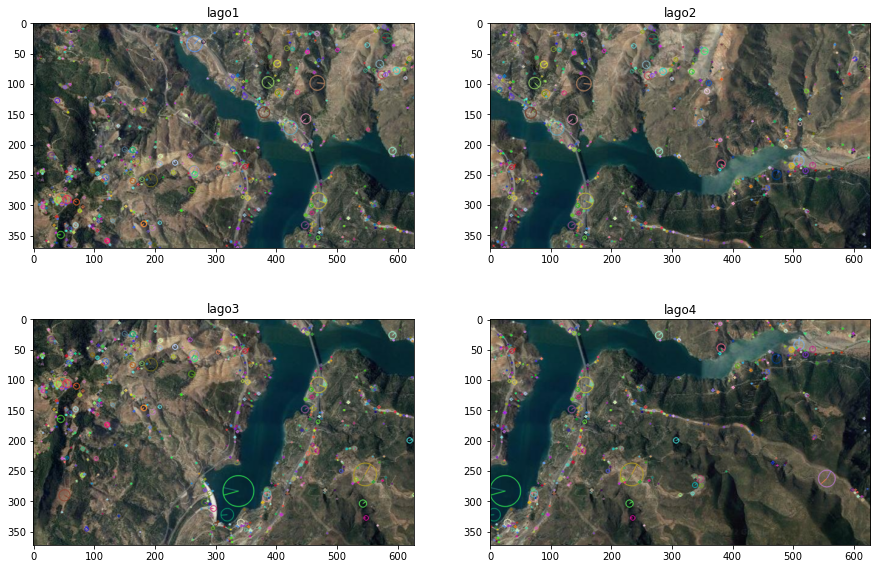

In [4]:
# obtengo keypoints
sift = cv2.SIFT_create(500)

keypoints, descriptors = sift.detectAndCompute(lago,None)
keypoints1, descriptors1 = sift.detectAndCompute(lago1,None)
keypoints2, descriptors2 = sift.detectAndCompute(lago2,None)
keypoints3, descriptors3 = sift.detectAndCompute(lago3,None)
keypoints4, descriptors4 = sift.detectAndCompute(lago4,None)

# pinto keypoints
img = lago.copy()
img = cv2.drawKeypoints(lago,keypoints,img, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img1 = cv2.drawKeypoints(lago1,keypoints1,lago1, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img2 = cv2.drawKeypoints(lago2,keypoints2,lago2, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img3 = cv2.drawKeypoints(lago3,keypoints3,lago3, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img4 = cv2.drawKeypoints(lago4,keypoints4,lago4, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Muestro resultados
fig = plt.figure(figsize=(10,10))
plt.title("lago")
plt.imshow(img, cmap="gray")
plt.show()

fig = plt.figure(figsize=(15,10))
ax = plt.subplot(2, 2, 1)
ax.set_title("lago1")
ax.imshow(img1, cmap='gray')

ax = plt.subplot(2, 2, 2)
ax.set_title("lago2")
ax.imshow(img2, cmap='gray')

ax = plt.subplot(2, 2, 3)
ax.set_title("lago3")
ax.imshow(img3, cmap='gray')

ax = plt.subplot(2, 2, 4)
ax.set_title("lago4")
ax.imshow(img4, cmap='gray')
plt.show()


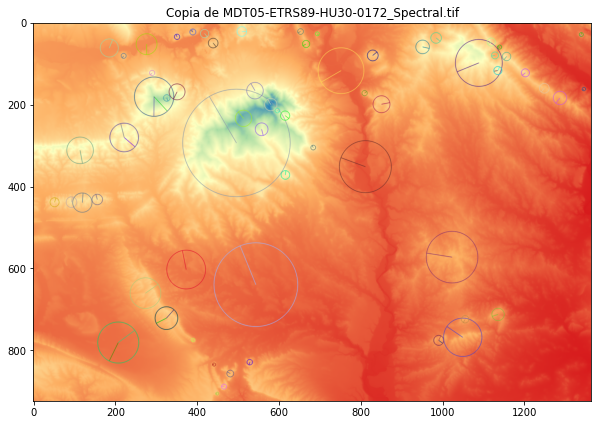

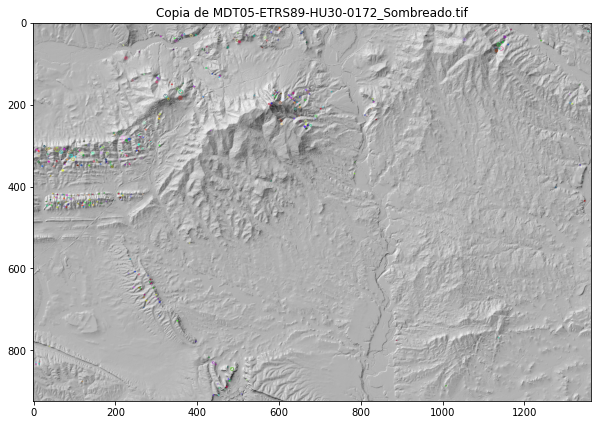

In [5]:
# Otras imagenes
MDT05_ETRS89_copia = leeimagen('Small/Copia de MDT05-ETRS89-HU30-0172_Spectral.tif', 1)
MDT05_ETRS89_copia_sombreado = leeimagen('Small/Copia de MDT05-ETRS89-HU30-0172_Sombreado.tif', 0)

# Redimensiono
MDT05_ETRS89_copia = cv2.resize(MDT05_ETRS89_copia, (int(MDT05_ETRS89_copia.shape[1]/4), int(MDT05_ETRS89_copia.shape[0]/4)))
MDT05_ETRS89_copia_sombreado = cv2.resize(MDT05_ETRS89_copia_sombreado, (int(MDT05_ETRS89_copia_sombreado.shape[1]/4), int(MDT05_ETRS89_copia_sombreado.shape[0]/4)))

# obtengo keypoints
keypoints1, descriptors1 = sift.detectAndCompute(MDT05_ETRS89_copia,None)
keypoints2, descriptors2 = sift.detectAndCompute(MDT05_ETRS89_copia_sombreado,None)

# pinto keypoints
img1 = cv2.drawKeypoints(MDT05_ETRS89_copia, keypoints1, MDT05_ETRS89_copia, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img2 = cv2.drawKeypoints(MDT05_ETRS89_copia_sombreado, keypoints2, MDT05_ETRS89_copia_sombreado, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Muestro resultados
fig = plt.figure(figsize=(10,10))
plt.title("Copia de MDT05-ETRS89-HU30-0172_Spectral.tif")
plt.imshow(img1)
plt.show()

fig = plt.figure(figsize=(10,10))
plt.title("Copia de MDT05-ETRS89-HU30-0172_Sombreado.tif")
plt.imshow(img2)
plt.show()

In [6]:
def func_sift(nombre_imagen, num_kp):
    # leo imagen
    imagen = leeimagen('filtros/' + nombre_imagen +'.jpg', 0)

    # Redimensiono
    imagen = cv2.resize(imagen, (1364, 924))
    
    kp_no_repetidos = []
    coords_almacenadas = []
    i = 0
    while (len(kp_no_repetidos) < num_kp and i < 20):
        i += 1
        sift = cv2.SIFT_create(num_kp*i)
        # obtengo keypoints
        keypoints, descriptors = sift.detectAndCompute(imagen,None)
        
        for kp in keypoints:
            if (len(kp_no_repetidos) < num_kp):
                # compruebo kp no repetido
                if (kp.pt not in coords_almacenadas):
                    coords_almacenadas.append(kp.pt)
                    kp_no_repetidos.append(kp)

    # pinto keypoints
    resultado = imagen.copy()
    resultado = cv2.drawKeypoints(imagen, kp_no_repetidos, resultado, RED, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    # Muestro resultados
    fig = plt.figure(figsize=(30,20))
    ax = plt.subplot(1, 1, 1)
    ax.set_title(nombre_imagen +"-SIFT-" + str(num_kp) + "kp")
    ax.imshow(resultado, cmap='gray')
    #ax.plot()
    
    # Exporto png
    plt.savefig('imagenes/resultados/' + nombre_imagen + "-SIFT-" + str(num_kp) + "kp")
    
    return kp_no_repetidos

## Generar ground truth

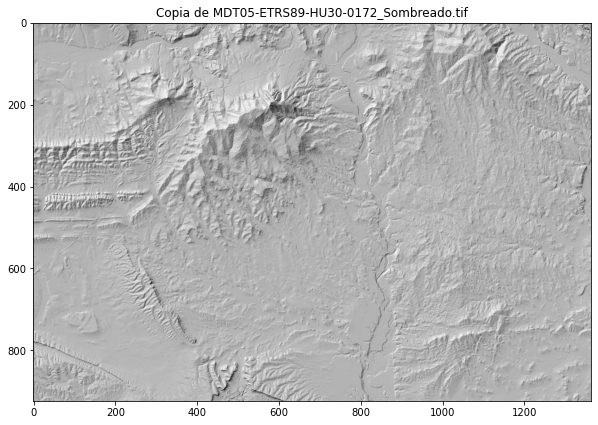

In [7]:
# Leo imagen
imagen = leeimagen('Small/Copia de MDT05-ETRS89-HU30-0172_Sombreado.tif', 0)

# Redimensiono
imagen = cv2.resize(imagen, (1364, 924))

# Muestro imagen
fig = plt.figure(figsize=(10,10))
plt.title("Copia de MDT05-ETRS89-HU30-0172_Sombreado.tif")
plt.imshow(imagen, cmap="gray")
plt.show()

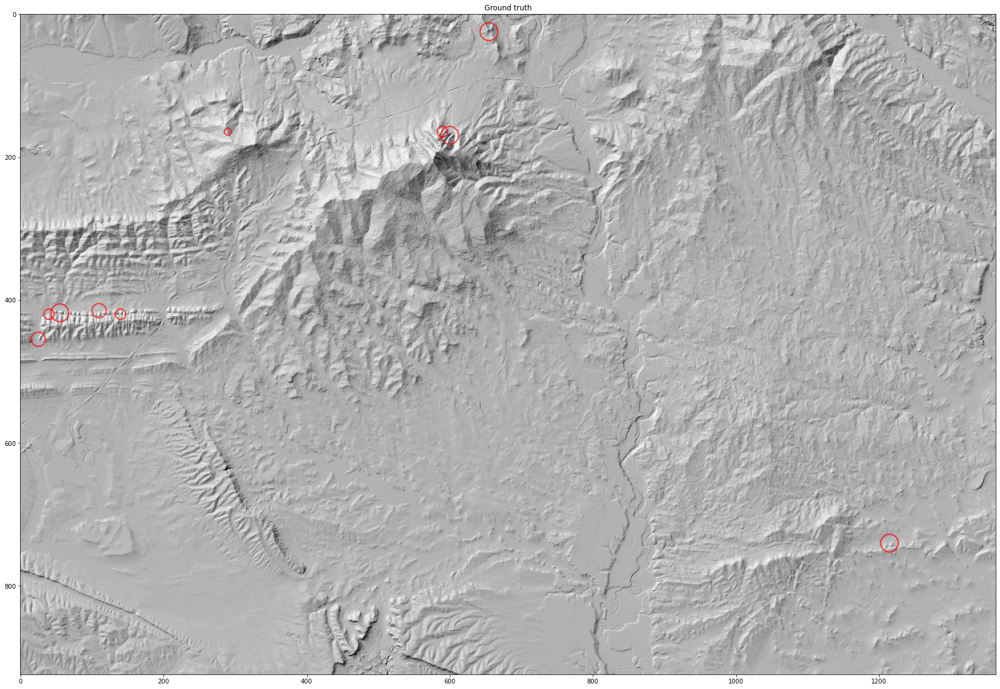

In [8]:
# Genero keypoints
keypoints_gt = []

keypoints_gt.append(cv2.KeyPoint(x=55, y=418, size=25))
keypoints_gt.append(cv2.KeyPoint(x=140, y=420, size=15))
keypoints_gt.append(cv2.KeyPoint(x=110, y=415, size=20))
keypoints_gt.append(cv2.KeyPoint(x=590, y=165, size=15))
keypoints_gt.append(cv2.KeyPoint(x=655, y=25, size=25))
keypoints_gt.append(cv2.KeyPoint(x=25, y=455, size=20))
keypoints_gt.append(cv2.KeyPoint(x=1215, y=740, size=25))
keypoints_gt.append(cv2.KeyPoint(x=600, y=170, size=25))
keypoints_gt.append(cv2.KeyPoint(x=290, y=165, size=10))
keypoints_gt.append(cv2.KeyPoint(x=40, y=420, size=15))

# pinto keypoints
nuevo_gt = imagen.copy()
nuevo_gt = cv2.drawKeypoints(imagen, keypoints_gt, nuevo_gt, RED, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Muestro imagen
fig = plt.figure(figsize=(30,20))
plt.title("Ground truth")
plt.imshow(nuevo_gt, cmap="gray")

# Exporto png
plt.savefig('imagenes/resultados/' + "Ground_truth")
plt.show()

## Aplicar SIFT

In [9]:
mypath = "imagenes/filtros"
imagenes = [f.split('.')[0] for f in listdir(mypath) if isfile(join(mypath, f))]
SOLUCIONES_SIFT = {}
SOLUCIONES_SIFT["ground_truth"] = {"keypoints":keypoints_gt}

try:
    kps_json = open("keypoints/sift_kps.json")
    fichero_kps = json.load(kps_json)
except:
    print(PRINT_RED + 'keypoints/sift_kps.json NO encontrado' + PRINT_NORMAL)
    fichero_kps = None
    
for imagen in imagenes:
    print (imagen, end=' ')
    try:
        #print(fichero_kps[imagen])
        # Si NUM_KP ha cambiado, recalculo los kps
        if (len(fichero_kps[imagen]["keypoints"]) != NUM_KP):
            print(PRINT_RED + 'recalculando' + PRINT_NORMAL, end=' ')
            SOLUCIONES_SIFT[imagen] = {"keypoints":func_sift(imagen,NUM_KP)}
            print(PRINT_GREEN + 'OK' + PRINT_NORMAL)
        
        # Si no me quedo con los ya calculados
        else:
            print(PRINT_CYAN + 'precalculado' + PRINT_NORMAL, end=' ')

            # Convierto dict a cv2.KeyPoint
            SOLUCIONES_SIFT[imagen] = {"keypoints":[]}
            for kp in fichero_kps[imagen]["keypoints"]:
                if isinstance(kp, dict):
                    SOLUCIONES_SIFT[imagen]["keypoints"].append(cv2.KeyPoint(x=kp["pt"][0],y=kp["pt"][1], size=kp["size"],angle=kp["angle"],
                                     response=kp["response"],octave=kp["octave"],class_id=kp["class_id"]))
                elif isinstance(kp, cv2.KeyPoint):
                    SOLUCIONES_SIFT[imagen]["keypoints"].append(kp)
                    
            print(PRINT_GREEN + 'OK' + PRINT_NORMAL)
    except:
        try:
            print(PRINT_RED + 'calculando' + PRINT_NORMAL, end=' ')
            SOLUCIONES_SIFT[imagen] = {"keypoints":func_sift(imagen,NUM_KP)}
            print(PRINT_GREEN + 'OK' + PRINT_NORMAL)
        except:
            print(PRINT_RED + 'ERROR: imagen {0}'.format(imagen) + PRINT_NORMAL)
    
# Guardo los kps en un fichero para ahorrarme recalcularlos en futuras iteraciones
serializable_kps = {}
for imagen in SOLUCIONES_SIFT:
    serializable_kps[imagen] = {"keypoints":[]}
    for kp in SOLUCIONES_SIFT[imagen]["keypoints"]:
        if isinstance(kp, cv2.KeyPoint):
            serializable_kps[imagen]["keypoints"].append({"pt":kp.pt,"angle":kp.angle,"response":kp.response,
                                         "size":kp.size, "octave":kp.octave, "class_id":kp.class_id})
        else:
            serializable_kps[imagen]["keypoints"].append(kp)

with open("keypoints/sift_kps.json", "w") as json_file:
    json.dump(serializable_kps, json_file)

    


Cross-Sectional_Curvature_MDE05 precalculado OK
Overland-Flow-Distance_MDE05 precalculado OK
Minimum_Curvature_MDE05 precalculado OK
Gradient_DEM05 precalculado OK
Downslope_Curvature_DEM05_1 precalculado OK
MRVBF_DEM05 precalculado OK
Vertical_Overland_Flow_Distance_MDE05 precalculado OK
Vertical_Distance_to_Channel_Network_MDE05 precalculado OK
Mass_Balance_Index_MDE05 precalculado OK
TPI_MDT05_5_100_75 precalculado OK
Valley_Index_MDE05 precalculado OK
MDE05_surf_texture precalculado OK
Profile_Curvature_MDE05 precalculado OK
MRRTF_DEM05 precalculado OK
Hill_Index_MDE05 precalculado OK
Terrain_Ruggedness_Index_(TRI)_DEM05_1 precalculado OK
Slope_Height_DEM05 precalculado OK
Terrain_Ruggedness_Index_(TRI)_DEM05 precalculado OK
Upslope_Curvature_DEM05 precalculado OK
Slope_Height_DEM05_1 precalculado OK
Mid-Slope_Positon_DEM05 precalculado OK
Slope_MDE05 precalculado OK
Protection_Index_DEM05 precalculado OK
Normalized_Height_DEM05_1 precalculado OK
Longitudinal_Curvature_MDE05 precal

In [10]:
def dentro_rango(kp1,kp2):
    distancia_x = abs(kp1.pt[0]-kp2.pt[0])
    distancia_y = abs(kp1.pt[1]-kp2.pt[1])
    distancia_xy = np.sqrt(distancia_x**2 + distancia_y**2)
    
    r1 = kp1.size/2
    r2 = kp2.size/2
    
    return distancia_xy <= r1 or distancia_xy <= r2

In [11]:
def num_coincidencias(kps1, kps2):
    coincidencias = 0
    for kp1 in kps1:
        coincide = False
        for kp2 in kps2:
            if (dentro_rango(kp1,kp2) and not coincide):
                coincidencias += 1
                coincide = True
    return coincidencias

In [12]:
coincidencias_totales = []
ptge_coincidencias_totales = []

for m1 in SOLUCIONES_SIFT.values():
    coincidencias = []
    ptge_coincidencias = []
    for m2 in SOLUCIONES_SIFT.values():
        coincidencias.append(num_coincidencias(m1["keypoints"], m2["keypoints"]))
        ptge_coincidencias.append(coincidencias[-1]/len(m1["keypoints"])*100)
    
    coincidencias_totales.append(coincidencias)   
    ptge_coincidencias_totales.append(ptge_coincidencias)

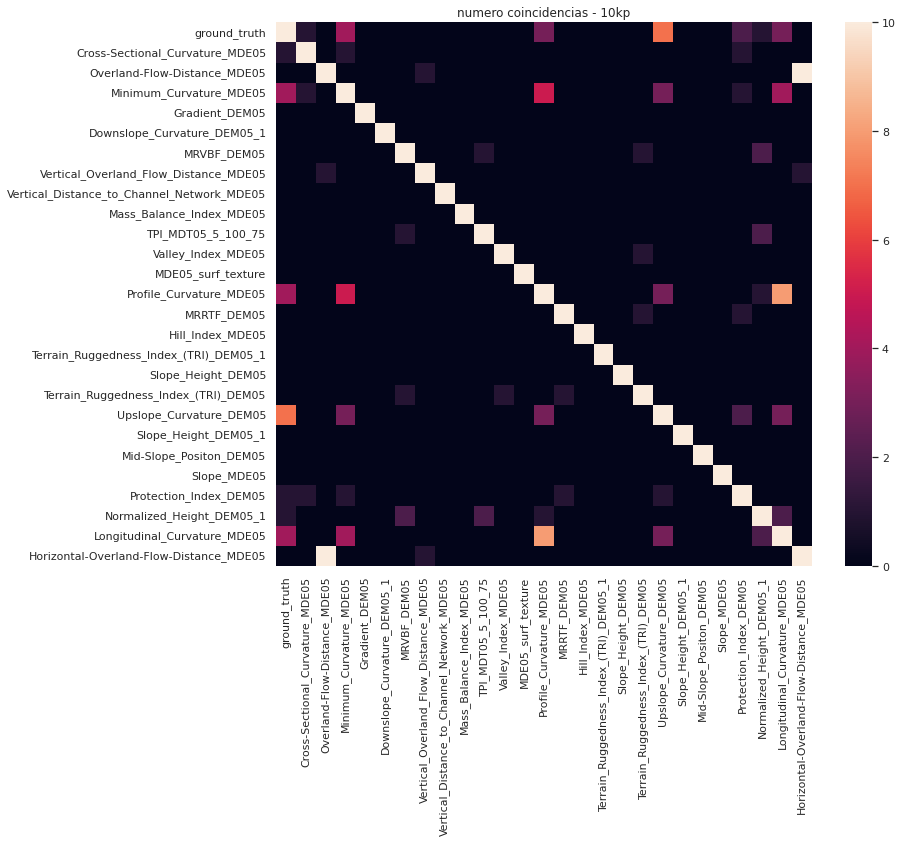

In [13]:
fig = plt.figure(figsize=(12,10))
sns.set_theme()
ax = sns.heatmap(coincidencias_totales, xticklabels = SOLUCIONES_SIFT.keys(), yticklabels = SOLUCIONES_SIFT.keys())
ax.set_title("numero coincidencias - 10kp")

# Exporto png
plt.savefig('imagenes/resultados/heatmap-SIFT-10kp')

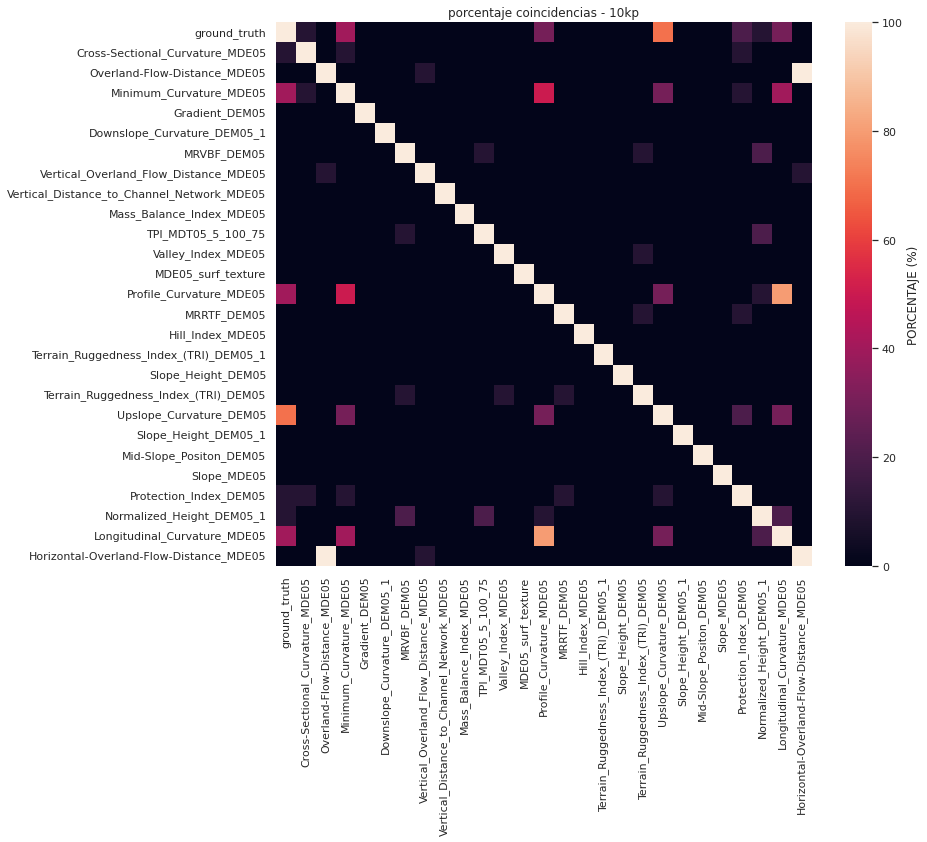

In [14]:
fig = plt.figure(figsize=(12,10))
sns.set_theme()
ax = sns.heatmap(ptge_coincidencias_totales, xticklabels = SOLUCIONES_SIFT.keys(), yticklabels = SOLUCIONES_SIFT.keys(),cbar_kws={'label': 'PORCENTAJE (%)'})
ax.set_title("porcentaje coincidencias - 10kp")

# Exporto png
plt.savefig('imagenes/resultados/heatmap_pct-SIFT-10kp')

https://www.juanbarrios.com/la-matriz-de-confusion-y-sus-metricas/

## Sensibilidad y Especifidad

La sensibilidad y la especificidad son dos valores que nos indican la capacidad de nuestro estimador para **discriminar los casos positivos, de los negativos**. La **sensibilidad** se representa como la fracción de verdaderos positivos, mientras que la **especificidad**, es la fracción de verdaderos negativos.

### Sensibilidad 

También se conoce como **Tasa de Verdaderos Positivos** (True Positive Rate) ó TP. Es la proporción de casos positivos que fueron correctamente identificadas por el algoritmo. Se calcula así: :  **VP/(VP+FN)**

### Especifidad

También conocida como la **Tasa de Verdaderos Negativos**, (“true negative rate”) o TN. Se trata de los casos negativos que el algoritmo ha clasificado correctamente.  Expresa cuan bien puede el modelo detectar esa clase.
Se calcula:  **VN/(VN+FP)**

## F1 score

Esta es otra métrica muy empleada porque nos **resume la precisión y sensibilidad** en una sola métrica. Por ello es de gran utilidad cuando la distribución de las clases es desigual, por ejemplo cuando el número de pacientes con una condición es del 15% y el otro es 85% , lo que en el campo de la salud es bastante común.

Se calcula: F1_score = (2*precision * sensibilidad) / (precision+sensibilidad)


__________________________________________________________________________________________


- **VP**: puntos detectados por la métrica que están en ground truth

- **FP**: puntos detectados por la métrica que NO están en ground truth

- **FN**: puntos del ground truth que NO han sido detectados por la métrica

- **VN**: ¿puntos que no están ni en la metrica ni en el ground truth? ¿Seria un punto por cada pixel no detectado?


In [15]:
def f1(precision, sensibilidad):
    try:
        return (2*precision*sensibilidad) / (precision+sensibilidad)
    except:
        return 0

In [16]:
verdaderos_positivos = []
falsos_positivos = []
verdaderos_negativos = []
falsos_negativos = []
sensibilidad = []
especifidad = []
precision_mdes = []
f1_scores = []
MEJOR_MDE = {
                "mde": "None",
                "f1_score": -1
            }
for k, m in SOLUCIONES_SIFT.items():
    VP = 0
    FP = 0
    #VN = 0
    FN = 0
    
    # Positivos
    for kp in m["keypoints"]:
        coincide = False
        for kp_gt in SOLUCIONES_SIFT["ground_truth"]["keypoints"]:
            if (dentro_rango(kp,kp_gt) and not coincide):
                VP += 1
                coincide = True
                
        if not coincide:
            FP += 1
            
    # Negativos
    for kp_gt in SOLUCIONES_SIFT["ground_truth"]["keypoints"]:
        coincide = False
        for kp in m["keypoints"]:
            if (dentro_rango(kp,kp_gt) and not coincide):
                #VN += 1
                coincide = True
                
        if not coincide:
            FN += 1
    
    verdaderos_positivos.append(VP)   
    falsos_positivos.append(FP)
    #verdaderos_negativos.append(VN)
    falsos_negativos.append(FN)
    sensibilidad.append( VP / (VP+FN) )
    #especifidad.append( VN / (VN+FP) )
    precision_mdes.append(VP / (VP+FP))
    f1_scores.append(f1(precision_mdes[-1], sensibilidad[-1]))
    
    # Guardo el mejor mde para analisis futuros
    if (f1_scores[-1] > MEJOR_MDE["f1_score"] and k != "ground_truth"):
        MEJOR_MDE["f1_score"] = f1_scores[-1]
        MEJOR_MDE["mde"] = k
        
print("MEJOR MDE:", MEJOR_MDE)


MEJOR MDE: {'mde': 'Upslope_Curvature_DEM05', 'f1_score': 0.7}


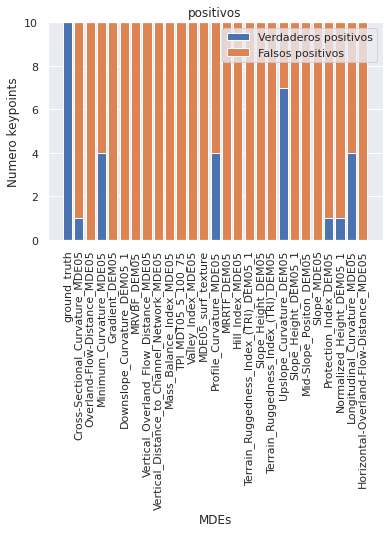

In [17]:
# POSITIVOS

indice = np.arange(len(SOLUCIONES_SIFT)) 
# Se crean las primeras barras
plt.bar(indice, verdaderos_positivos, label='Verdaderos positivos')
 
# Se crean las segundas barras y se apilan sobre las primeras
plt.bar(indice, falsos_positivos, label='Falsos positivos',  bottom=verdaderos_positivos)
 
plt.xticks(indice, SOLUCIONES_SIFT.keys(), rotation=90)
plt.ylabel("Numero keypoints")
plt.xlabel("MDEs")
plt.title('positivos')
plt.legend()
 
# Exporto png
plt.savefig('imagenes/resultados/positivos')

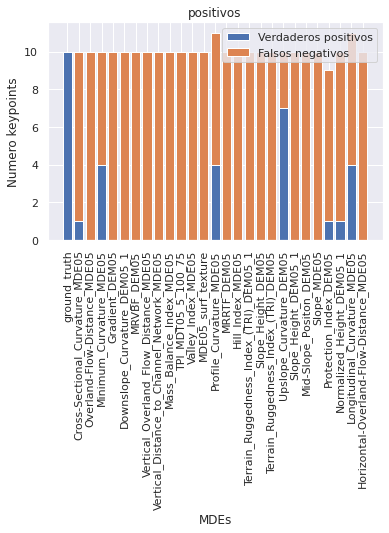

In [18]:
# POSITIVOS

indice = np.arange(len(SOLUCIONES_SIFT)) 
# Se crean las primeras barras
plt.bar(indice, verdaderos_positivos, label='Verdaderos positivos')
 
# Se crean las segundas barras y se apilan sobre las primeras
plt.bar(indice, falsos_negativos, label='Falsos negativos',  bottom=verdaderos_positivos)

plt.xticks(indice, SOLUCIONES_SIFT.keys(), rotation=90)
plt.ylabel("Numero keypoints")
plt.xlabel("MDEs")
plt.title('positivos')
plt.legend()
 
# Exporto png
plt.savefig('imagenes/resultados/positivos-falsos_neg')

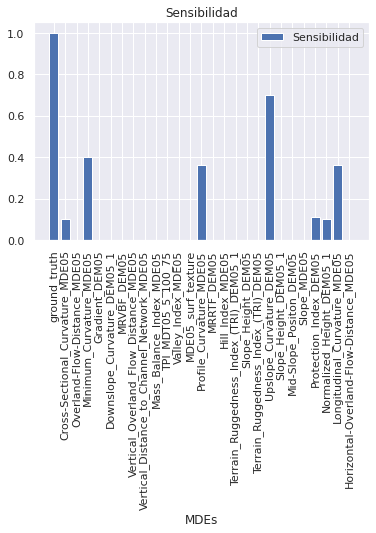

In [19]:
# SENSIBILIDAD

indice = np.arange(len(sensibilidad)) 
# Se crean las primeras barras
plt.bar(indice, sensibilidad, label='Sensibilidad')

plt.xticks(indice, SOLUCIONES_SIFT.keys(), rotation=90)
plt.xlabel("MDEs")
plt.title('Sensibilidad')
plt.legend()
 
# Exporto png
plt.savefig('imagenes/resultados/sensibilidad')

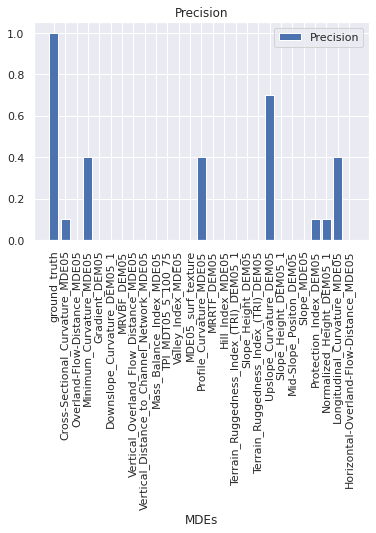

In [20]:
# PRECISION

indice = np.arange(len(precision_mdes)) 
# Se crean las primeras barras
plt.bar(indice, precision_mdes, label='Precision')

plt.xticks(indice, SOLUCIONES_SIFT.keys(), rotation=90)
plt.xlabel("MDEs")
plt.title('Precision')
plt.legend()
 
# Exporto png
plt.savefig('imagenes/resultados/precision')

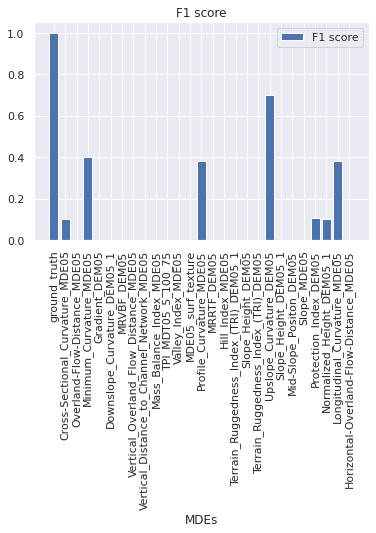

In [21]:
# F1

indice = np.arange(len(f1_scores)) 
# Se crean las primeras barras
plt.bar(indice, f1_scores, label='F1 score')

plt.xticks(indice, SOLUCIONES_SIFT.keys(), rotation=90)
plt.xlabel("MDEs")
plt.title('F1 score')
plt.legend()
 
# Exporto png
plt.savefig('imagenes/resultados/f1score-metricas')

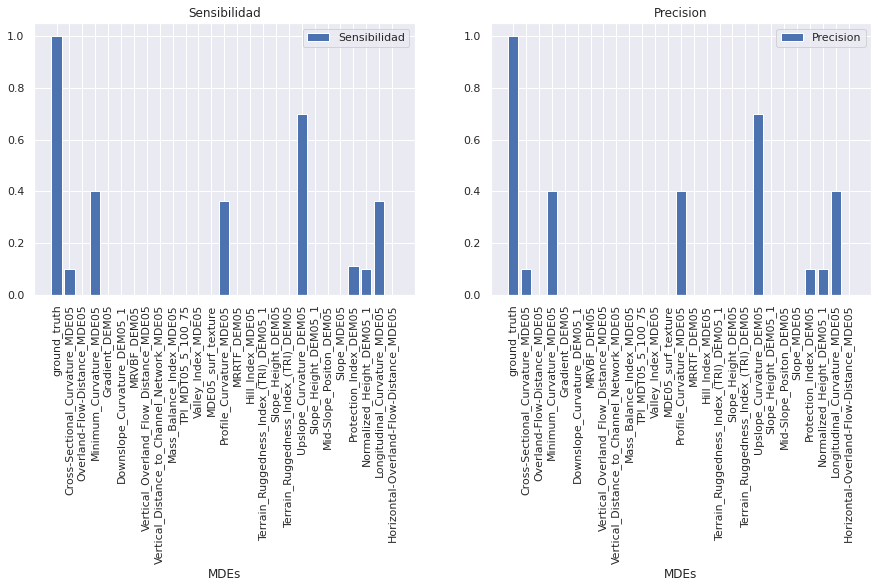

In [22]:
# SENSIBILIDAD

indice = np.arange(len(sensibilidad)) 

fig = plt.figure(figsize=(15,5))

# Se crean las primeras barras
#sens = plt.bar(indice, sensibilidad, label='Sensibilidad')

plt.subplot(1, 2, 1)
plt.bar(indice, sensibilidad, label='Sensibilidad')
plt.xticks(indice, SOLUCIONES_SIFT.keys(), rotation=90)
plt.xlabel("MDEs")
plt.title('Sensibilidad')
plt.legend()
#plt.plot(sens)

# PRECISION

indice = np.arange(len(precision_mdes)) 
# Se crean las primeras barras
#prec = plt.bar(indice, precision_mdes, label='Precision')

plt.subplot(1, 2, 2)
plt.bar(indice, precision_mdes, label='Precision')
plt.xticks(indice, SOLUCIONES_SIFT.keys(), rotation=90)
plt.xlabel("MDEs")
plt.title('Precision')
plt.legend()
#plt.plot(prec)
 
# Exporto png
plt.savefig('imagenes/resultados/sens-prec')


## Algoritmo genetico

Poblacion formada por X combinaciones de entre 2 y num_metricas distintas.

Realizo X emparejamientos binarios aleatorios, quedandome con el mejor, para obtener los X padres. Un padre puede estar repetido, pero no se pude emparejar una combinacion contra sí misma.

Generar hijos: cruzo los padres i y i+1 para ahorrar costo de tiempo de ejecución en la generación de números aleatorios. Para cada pareja de padres genero 2 hijos con un numero aleatorio de metricas de entre el maximo y el minimo de los padres. Una vez establecido el numero de métricas, selecciono aleatoriamente una metrica de uno de los dos padres, y compruebo que dicha metrica no está repetida.

Una vez generados los X hijos, reemplazan a la generación anterior, y repito el proceso 10000 veces. Finalmente me quedo con la mejor solucion de la ultima generacion.

In [23]:
def calcular_f1_score(metrica, ground_truth):    
    VP = 0
    FP = 0
    #VN = 0
    FN = 0
    
    # Positivos
    for kp in metrica["keypoints"]:
        coincide = False
        for kp_gt in ground_truth["keypoints"]:
            if (dentro_rango(kp,kp_gt) and not coincide):
                VP += 1
                coincide = True
                
        if not coincide:
            FP += 1
            
    # Negativos
    for kp_gt in ground_truth["keypoints"]:
        coincide = False
        for kp in metrica["keypoints"]:
            if (dentro_rango(kp,kp_gt) and not coincide):
                #VN += 1
                coincide = True
                
        if not coincide:
            FN += 1
    
    sensibilidad = VP / (VP+FN)
    precision = VP / (VP+FP)
    return f1(precision, sensibilidad)

In [24]:
class Nodo:
    def __init__(self, accion, n1, n2, padre=None):
        if accion not in ["union", "interseccion"]:
            raise Exception ("Accion incorrecta, debe ser 'union' o 'interseccion'")
        if not n1 or not n2:
            raise Exception ("Nodos incorrectos")
        if not isinstance(n1,Nodo) or not isinstance(n1,Nodo):
            raise Exception ("Nodos incorrectos")
        
        n1.padre = self
        n2.padre = self
        
        self.accion = accion
        self.n1 = n1
        self.n2 = n2
        self.padre = padre
    
    def obtenerNodoRaiz(self):
        if not self.padre:
            return self
        else:
            n = self.padre
            while n.padre:
                n = n.padre
            return n
    
    def buscarNodoEnHijos(self, nodo):
        if not isinstance(nodo,Nodo):
            raise Exception ("Nodo incorrecto")
            
        if nodo == self:
            return self
        if not isinstance(self,Hoja):
            if self.n1.buscarNodoEnHijos(nodo):
                return self.n1
            if self.n2.buscarNodoEnHijos(nodo):
                return self.n2
            
        return None
            
        
    def buscarNodoEnArbol(self, nodo):
        if not isinstance(nodo,Nodo):
            raise Exception ("Nodo incorrecto")
        
        raiz = self.obtenerNodoRaiz()
        return raiz.buscarNodoEnHijos(nodo)
        
    
    def __str__(self):
        if self.accion == "union":
            str_acc = "U"
        elif self.accion == "interseccion":
            str_acc = "∩"
        return "({0} {1} {2})".format(self.n1, str_acc, self.n2)
    
    def copy(self):
        return Nodo(self.accion, self.n1, self.n2, self.padre)
        
            

class Hoja (Nodo):
    def __init__(self, nombre_mde, padre=None):
        self.mde = nombre_mde
        self.padre = padre
        
    def __str__(self):
        return str(self.mde)
    
    def copy(self):
        return Hoja(self.mde, self.padre)
        
        
hoja = Hoja("metrica")
nodo = Nodo("interseccion", hoja, hoja)
nodo2 = Nodo("union", nodo, hoja)

print(nodo2)
print("∩")

print("Nodo:", nodo)
print("Raiz:", nodo.obtenerNodoRaiz())

print("Buscar1:", nodo.buscarNodoEnArbol(hoja))
print("Buscar2:", nodo.buscarNodoEnArbol(Hoja("metrica2")))


((metrica ∩ metrica) U metrica)
∩
Nodo: (metrica ∩ metrica)
Raiz: ((metrica ∩ metrica) U metrica)
Buscar1: (metrica ∩ metrica)
Buscar2: None


In [25]:
def crearArbolBinarioAleatorio(hojas):
    """
    El parametro hojas es una lista de hojas con las métricas que componen el árbol
    Si solo hay una, entonces se devuelve dicha hoja
    """
    if not hojas:
        return None
    if len(hojas) == 1:
        return hojas[0]
    
    """
    Un nodo está formado por una accion (union o interseccion) y:
        - 2 nodos
        - 2 hojas
        - 1 nodo y 1 hoja
    Una hoja es la metrica que compone el arbol
    Cada hoja forma un nodo con otra hoja o bien con otro nodo, de forma aleatoria
    """
    acciones = ["union", "interseccion"]
    nodos = []
    hojas_libres = hojas.copy()
    
    # En primer lugar meto todas las hojas en un nodo, bien con otra hoja, bien con otro nodo, 
    # de forma aleatoria, con una accion tambien aleatoria
    while hojas_libres:
        # Selecciono una de las hojas que quedan libres
        hoja = random.choice(hojas_libres)
        hojas_libres.remove(hoja)
        
        # Selecciono el nodo hermano de forma aleatoria entre el resto de hojas libres y los nodos ya formados
        posibles_hermanos = hojas_libres + nodos
        hermano = random.choice(posibles_hermanos)
        
        # Selecciono una accion aleatoria
        accion = random.choice(acciones)
        
        # Creo el nodo
        nodos.append(Nodo(accion, hoja, hermano))
        
        # Si el hermano era una hoja libre, la elimino como hoja libre
        try:
            hojas_libres.remove(hermano)
        except:
            pass
        
        # Si el hermano era un nodo, la elimino de nodos, pues queda reemplazado por el nuevo
        try:
            nodos.remove(hermano)
        except:
            pass
        
        
    # Una vez tengo todas las hojas 'hermanadas', creo nodos nuevos para conectar los nodos que tengo 
    # hasta que estén todos conectados
    # Para ello obtengo la raiz de todas las ramas generadas, y las conecto de forma aleatoria
    raices = set()
    for nodo in nodos:
        raices.add(nodo.obtenerNodoRaiz())
        
    raices = list(raices)
    while len(raices) > 1:
        # Selecciono 2 ramas aleatorias
        raiz1 = random.choice(raices)
        raices.remove(raiz1)
        raiz2 = random.choice(raices)
        raices.remove(raiz2)
          
        # Selecciono una accion aleatoria
        accion = random.choice(acciones)  
        
        # Conecto las dos raices
        nueva_raiz = Nodo(accion, raiz1, raiz2)
        raices.append(nueva_raiz)
        
    return raices[0]
    

def generarPoblacionAleatoria(metricas, num_combinaciones, min_metricas, max_metricas, modo):
    if modo not in ["union", "interseccion","union/interseccion"]:
        raise ("Modo debe ser 'union', 'interseccion' o 'union/interseccion'")
            
    if min_metricas >= max_metricas or min_metricas < 1 or max_metricas > len(metricas):
        raise("Invalido 'min_metricas'={0} o 'max_metricas'={1}".format(min_metricas, max_metricas))
            
    # No incluyo el ground truth en las poblaciones
    try:
        metricas.remove("ground_truth")
        if (max_metricas > len(metricas)):
            max_metricas = len(metricas)
    except:
        pass
    
    poblacion = []
    for _ in range(num_combinaciones):
        # Genero una combinacion aleatoria de entre 2 y len(metricas) metricas combinadas, sin repetir
        combinacion = {"metricas":set()}
        num_metricas = random.randint(min_metricas, max_metricas)
        
        # Para optimizar el proceso de obtener una metrica aleatoria sin repetir, voy a hacer una copia
        # de 'metricas' de donde iré eliminando las metricas ya seleccionadas
        metricas_restantes = metricas.copy()
        
        while len(combinacion["metricas"]) < num_metricas:            
            m = random.choice(metricas_restantes)
            combinacion["metricas"].add(m)
            metricas_restantes.remove(m)
            
        if modo == "union/interseccion":
            # Una vez tengo la lista de metricas, selecciono la relacion (union/interseccion)
            # que tiene cada metrica con la siguiente, de forma que tendre num_metricas-1 relaciones
            # Estas relaciones se aplicaran de forma secuencial
            
            # Creo una hoja por cada metrica
            hojas = []
            for m in combinacion["metricas"]:
                hojas.append(Hoja(m))
            
            combinacion["arbol"] = crearArbolBinarioAleatorio(hojas)
            
        poblacion.append(combinacion)
    
    return poblacion

def unionKP(metricas, listas_kp:dict):
    all_kp = []
    for metrica in metricas:
        all_kp += listas_kp[metrica]["keypoints"]
    # Eliminando kp duplicados
    return list(set(all_kp))

def interseccionKP(metricas, listas_kp:dict):
    interseccion_kp = []
    for m1 in metricas:
        for kp1 in listas_kp[m1]["keypoints"]:
            # Si el punto ya ha sido añadido a la lista de interseccion no lo busco en las metricas
            if not (kp1 in interseccion_kp):
                inters = True
                # Busco si kp1 está en todas las metricas
                for m2 in metricas:
                    if m1 != m2:
                        inters = False
                        for kp2 in [x for x in listas_kp[m2]["keypoints"] if not inters]:
                            if dentro_rango(kp1,kp2):
                                # Si coincide con algun punto de m2, dejo de buscar en m2
                                inters = True

                        # Si tras recorrer m2, inters=False, ya no hay interseccion con todas 
                        # las metricas, por lo que dejo de buscar kp1 en el resto de metricas
                        if not inters:
                            break

                # Si se ha encontrado el punto en todas las metricas (inters=True)
                # entonces pertenece a la interseccion de todas
                if inters:
                    interseccion_kp.append(kp1)
    
    return interseccion_kp

def union_interseccionKP(nodo, listas_kp:dict):
    # Si estoy en un nodo hoja, devuelvo sus keypoints
    if isinstance(nodo, Hoja):
        return listas_kp[nodo.mde]["keypoints"]
    
    # Obtengo los kps del primer hijo
    if isinstance(nodo.n1, Hoja):
        kps1 = listas_kp[nodo.n1.mde]["keypoints"]
    else:
        kps1 = union_interseccionKP(nodo.n1, listas_kp)
    
    # Obtengo los kps del segundo hijo
    if isinstance(nodo.n2, Hoja):
        kps2 = listas_kp[nodo.n2.mde]["keypoints"]
    else:
        kps2 = union_interseccionKP(nodo.n2, listas_kp)
    
    kps = []
    if nodo.accion == "union":
        kps = kps1 + kps2
        # Elimino repetidos
        return list(set(kps))
    elif nodo.accion == "interseccion":
        for kp1 in kps1:
            for kp2 in kps2:
                if dentro_rango(kp1,kp2):
                    kps.append(kp1)
                    break
        
        # Elimino repetidos
        return list(set(kps))        

"""
Penalizacion exponencial, para penalizar mas a aquellas combinaciones que repitan más métricas
"""
PENALIZACION = 1.5
def penalizacion_metricas_repetidas(num_metricas_repetidas):
    return PENALIZACION**num_metricas_repetidas

def contarMetricasRepetidas(metricas):
    contador = {}
    for m in metricas:
        contador[m] = metricas.count(m)
        
    num_repeticiones = 0
    for m in contador.keys():
        num_repeticiones += contador[m]-1 # resto 1 porque si una metrica aparece solo 1 vez, no cuenta como repetida
                                          # y si aparece 2, solo cuenta como 1 repetido
            
    return num_repeticiones
    
def obtenerMetricasArbol(arbol):
    if isinstance(arbol, Hoja):
        return [arbol.mde]
    
    metricas_arbol = []
    
    # Recorro el arbol hasta llegar a un nodo hoja y añadir la metrica
    
    # Hijo1
    if isinstance(arbol.n1, Hoja):
        metricas_arbol.append(arbol.n1.mde)
    else:
        metricas_arbol += obtenerMetricasArbol(arbol.n1)
    
    # Hijo2
    if isinstance(arbol.n2, Hoja):
        metricas_arbol.append(arbol.n2.mde)
    else:
        metricas_arbol += obtenerMetricasArbol(arbol.n2)
        
    return metricas_arbol
    
    
def evaluarPoblacion(poblacion, soluciones_sift, modo:str, mejor_combinacion_anterior=None):
    if modo not in ["union", "interseccion","union/interseccion"]:
        raise ("Modo debe ser 'union', 'interseccion' o 'union/interseccion'")
       
    mejor_combinacion = {"f1_score":-1, "metricas":set()}

    if modo == "union":
        # Me quedo con los kp de la union
        for combinacion in poblacion:
            combinacion["keypoints"] = unionKP(combinacion["metricas"], soluciones_sift)

            # Una vez tengo los kp de la union, calculo  f1
            combinacion["f1_score"] = calcular_f1_score(combinacion, soluciones_sift["ground_truth"])

            # Guardo mejor combinacion
            if (combinacion["f1_score"] > mejor_combinacion["f1_score"]):
                mejor_combinacion = combinacion

            elif(combinacion["f1_score"] == mejor_combinacion["f1_score"] and len(combinacion["metricas"]) < len(mejor_combinacion["metricas"])):
                mejor_combinacion = combinacion

    elif modo == "interseccion":
        # Nos unicamente quedamos con la interseccion de los kp
        for combinacion in poblacion:
            combinacion["keypoints"] = interseccionKP(combinacion["metricas"], soluciones_sift)

            # Una vez tengo los kp de la interseccion, calculo  f1
            if combinacion["keypoints"]:
                combinacion["f1_score"] = calcular_f1_score(combinacion, soluciones_sift["ground_truth"])
            else:    
                # Si la interseccion es vacia entonces f1=0
                combinacion["f1_score"] = 0
                
            # Guardo mejor combinacion
            if (combinacion["f1_score"] > mejor_combinacion["f1_score"]):
                mejor_combinacion = combinacion

            elif(combinacion["f1_score"] == mejor_combinacion["f1_score"] and len(combinacion["metricas"]) < len(mejor_combinacion["metricas"])):
                mejor_combinacion = combinacion

    elif modo == "union/interseccion":  
        # Aplicamos la relacion entre cada metrica de forma secuencial
        for combinacion in poblacion:
            
            # Evito reevaluar el mejor anterior porque ya está evaluado
            if mejor_combinacion_anterior != combinacion:
                combinacion["keypoints"] = union_interseccionKP(combinacion["arbol"], soluciones_sift)
                combinacion["metricas"] = obtenerMetricasArbol(combinacion["arbol"])

                # Una vez tengo los kp del arbol, calculo  f1
                if combinacion["keypoints"]:
                    num_rep = contarMetricasRepetidas(combinacion["metricas"])
                    p = penalizacion_metricas_repetidas(num_rep)
                    combinacion["f1_score"] = calcular_f1_score(combinacion, soluciones_sift["ground_truth"])/penalizacion_metricas_repetidas(num_rep)

                else:    
                    # Si la interseccion es vacia entonces f1=0
                    combinacion["f1_score"] = 0
                    p = 1
                
            # Guardo mejor combinacion
            if (combinacion["f1_score"] > mejor_combinacion["f1_score"]):
                mejor_combinacion = combinacion
            
            elif(combinacion["f1_score"] == mejor_combinacion["f1_score"] and len(combinacion["metricas"]) < len(mejor_combinacion["metricas"])):
                mejor_combinacion = combinacion
                
        
    return poblacion, mejor_combinacion   

def seleccionarPadres(poblacion):
    poblacion_padres = []
    for _ in range(len(poblacion)):
        emparejamiento = [0,0]
        while emparejamiento[0] == emparejamiento[1]:
            emparejamiento = random.choices(poblacion, k=2)
        # Me quedo con el que tenga mejor f1_score
        # En caso de empate me quedo con el que utilice menos metricas
        if(emparejamiento[0]["f1_score"] == emparejamiento[1]["f1_score"]):
            if(len(emparejamiento[0]["metricas"]) < len(emparejamiento[1]["metricas"])):
                poblacion_padres.append(emparejamiento[0])
            else:
                poblacion_padres.append(emparejamiento[1])
        elif(emparejamiento[0]["f1_score"] > emparejamiento[1]["f1_score"]):
            poblacion_padres.append(emparejamiento[0])
        else:
            poblacion_padres.append(emparejamiento[1])
    return poblacion_padres

PC = 0.7
def generarHijos(padres):
    hijos = padres
    num_cruces = int(len(padres) * PC)
    for p in range(num_cruces):
        # Para cada cruce genero 2 hijos
        for h in range(2):
            
            # Metricas utilizadas entre los dos padres
            metricas_padres = set(padres[p]["metricas"]).union(padres[p+1]["metricas"])
            
            # num_metricas_hijo = valor aleatorio entre el numero de metricas de los dos padres
            if(len(padres[p]["metricas"]) < len(padres[p+1]["metricas"])):
                num_metricas_hijo = random.randint(len(padres[p]["metricas"]), len(padres[p+1]["metricas"]))
            else:
                num_metricas_hijo = random.randint(len(padres[p+1]["metricas"]), len(padres[p]["metricas"]))
            
            # Selecciono num_metricas_hijo aleatorias de las metricas de los padres, sin repetir
            hijo = {"metricas":set()}
            metricas_padres = list(metricas_padres)
            while len(hijo["metricas"]) < num_metricas_hijo:
                hijo["metricas"].add(random.choice(metricas_padres))
            hijos[p+h] = hijo
            
    return hijos

def evaluarRama(rama, soluciones_sift):
    if isinstance(rama,Hoja):
        metricas = [rama.mde]
        keypoints = soluciones_sift[rama.mde]["keypoints"]
    else:
        metricas = obtenerMetricasArbol(rama)
        keypoints = union_interseccionKP(rama, soluciones_sift)

    # Una vez tengo los kp del arbol, calculo  f1
    if keypoints:
        num_rep = contarMetricasRepetidas(metricas)
        solucion = {
            "arbol":rama,
            "metricas":metricas,
            "keypoints":keypoints,
        }
        return calcular_f1_score(solucion, soluciones_sift["ground_truth"])/penalizacion_metricas_repetidas(num_rep)

    else:    
        # Si la interseccion es vacia entonces f1=0
        return 0

def generarHijosArbol(padres):
    hijos = padres
    num_cruces = int(len(padres) * PC)
    for p in range(num_cruces):
        # Para cada cruce genero 2 hijos
        for h in range(2):
            
            # Cada hijo va ha estar formado por la mejor rama de cada uno de sus padres
            # Y una accion aleatoria de entre las acciones de sus padres
            
            # Si alguno de los padres es una hoja, entonces el hijo será la combinación de esta hoja
            # con la mejor rama del otro padre
            
            if isinstance(padres[p]["arbol"], Hoja):
                rama1 = padres[p]["arbol"]
            else:
                ev_1 = evaluarRama(padres[p]["arbol"].n1, SOLUCIONES_SIFT)
                ev_2 = evaluarRama(padres[p]["arbol"].n2, SOLUCIONES_SIFT)
                if (ev_1 > ev_2):
                    rama1 = padres[p]["arbol"].n1.copy()
                else:
                    rama1 = padres[p]["arbol"].n2.copy()
                
            
            
            if isinstance(padres[p+1]["arbol"], Hoja):
                rama2 = padres[p+1]["arbol"]
            else:
                ev_1 = evaluarRama(padres[p+1]["arbol"].n1, SOLUCIONES_SIFT)
                ev_2 = evaluarRama(padres[p+1]["arbol"].n2, SOLUCIONES_SIFT)
                if (ev_1 > ev_2):
                    rama2 = padres[p+1]["arbol"].n1.copy()
                else:
                    rama2 = padres[p+1]["arbol"].n2.copy()
                    
            # Si los dos padres son hojas, entonces la accion del hijo será una aleatoria entre union e interseccion
            # Si solo uno de los padres es hoja, la accion del hijo será la acción del otro padre
            # Si ninguno de los padres es hoja, la accion del hijo será una aleatoria entre las acciones de los dos padres
                # de forma que si estos tienen la misma acción, se asegure la permanencia de esta
            if isinstance(padres[p]["arbol"], Hoja) and isinstance(padres[p+1]["arbol"], Hoja):
                accion = random.choice(["union", "interseccion"])
                
            elif isinstance(padres[p]["arbol"], Hoja):
                accion = padres[p+1]["arbol"].accion
                
            elif isinstance(padres[p+1]["arbol"], Hoja):
                accion = padres[p]["arbol"].accion
                
            else:
                accion = random.choice([padres[p]["arbol"].accion,padres[p+1]["arbol"].accion])
            
            # Creo el arbol del hijo
            arbol_hijo = Nodo(accion,rama1,rama2)            
            hijos[p+h] = {"arbol":arbol_hijo, "metricas":obtenerMetricasArbol(arbol_hijo)}
            
    return hijos

def buscarMetricaEnArbol(arbol, mde):
    if isinstance(arbol, Hoja):
        if arbol.mde == mde:
            return arbol
        else:
            return None
        
    # Hijo 1
    mde_en_n1 = buscarMetricaEnArbol(arbol.n1, mde)
    if mde_en_n1:
        return mde_en_n1
        
    # Hijo 2
    mde_en_n2 = buscarMetricaEnArbol(arbol.n2, mde)
    if mde_en_n2:
        return mde_en_n2
    
    # Si no se ha encontrado devuelvo nulo
    return None
    
# Se reemplaza una metrica de la solucion por una que no esté
def mutar(combinacion, metricas):
    nueva_metrica = random.choice(metricas)
    while nueva_metrica in combinacion["metricas"]:
        disponibles = set(metricas) - set(combinacion["metricas"])
        
        # Si la combinación contiene todas las métricas, entonces simplemente se elimina una al azar
        try:
            nueva_metrica = random.choice(list(disponibles))
        except:
            nueva_metrica = None
            
    # Elimino un elemento aleatorio y añado la nueva
    eliminado = random.choice(list(combinacion["metricas"]))
    combinacion["metricas"].remove(eliminado)
    if nueva_metrica:
        combinacion["metricas"].add(nueva_metrica)
    return combinacion

def mutarArbol(combinacion, metricas):
    combinacion["metricas"] = obtenerMetricasArbol(combinacion["arbol"])
    nueva_metrica = random.choice(metricas)
    while nueva_metrica in combinacion["metricas"]:
        nueva_metrica = random.choice(metricas)
        
    # Reemplazo una metrica aleatoria por una nueva
    hoja = None
    while not hoja:
        reemplazo = random.choice(combinacion["metricas"])
        hoja = buscarMetricaEnArbol(combinacion["arbol"], reemplazo)
        
    hoja.mde = nueva_metrica
    combinacion["metricas"].remove(reemplazo)
    combinacion["metricas"].append(nueva_metrica)
    
    return combinacion

def mutaciones(poblacion, metricas, mejor_combinacion, arbol=False):
    # Mutan el 20% de la poblacion
    num_mutaciones = int(len(poblacion) * 0.2)
    
    # Compruebo que no se mute la mejor combinacion para evitar empeorarla
    seleccion = True
    while seleccion:
        seleccion = False
        # Son las soluciones de la poblacion que van a mutar
        indice_mutaciones = set()
        while len(indice_mutaciones) < num_mutaciones:
            indice_mutaciones.add(random.randint(0, len(poblacion)-1))
            
        # Compruebo que no se ha seleccionado la mejor combinacion
        for i in indice_mutaciones:
            if poblacion[i] == mejor_combinacion:
                # Obligo a seleccionar de nuevo
                seleccion = True
            
        
        
    for i in indice_mutaciones:
        if arbol:
            poblacion[i] = mutarArbol(poblacion[i], metricas)
        else:
            poblacion[i] = mutar(poblacion[i], metricas)
        
    return poblacion

# Reemplaza la generacion anterior, por la nueva, manteniendo la mejor solucion
def reemplazo(hijos, mejor_combinacion_anterior, SOLUCIONES_SIFT, modo:str):
    hijos[-1] = mejor_combinacion_anterior
    return evaluarPoblacion(hijos, SOLUCIONES_SIFT, modo, mejor_combinacion_anterior)
        

## Union de métricas

In [26]:
# APLICO EL ALGORITMO GENETICO

print("Genero poblacion inicial")

# Genero poblacion inicial
poblacion = generarPoblacionAleatoria(list(SOLUCIONES_SIFT.keys()), num_combinaciones=50, modo="union",
                                      min_metricas=1, max_metricas=len(list(SOLUCIONES_SIFT.keys())))

print("Poblacion inicial generada")

# Evaluo poblacion
poblacion, mejor_combinacion = evaluarPoblacion(poblacion, SOLUCIONES_SIFT, "union")

print("mejor inicial".upper(),mejor_combinacion["f1_score"], "->" , len(mejor_combinacion["metricas"]))

mejores_scores = [mejor_combinacion["f1_score"]]
for _ in range(100):

    padres = seleccionarPadres(poblacion)
    
    hijos = generarHijos(padres)
    
    hijos = mutaciones(hijos, imagenes, mejor_combinacion) 
    
    poblacion, mejor_combinacion = reemplazo(hijos, mejor_combinacion, SOLUCIONES_SIFT, "union")
    
    if((_+1) % 10 == 0):
        mejores_scores.append(mejor_combinacion["f1_score"])
        print(_+1, ":", mejor_combinacion["f1_score"], "->" ,  len(mejor_combinacion["metricas"]))
        
print("mejor_combinacion".upper(),mejor_combinacion["f1_score"], "->" , len(mejor_combinacion["metricas"]))
print(mejor_combinacion["metricas"])


Genero poblacion inicial
Poblacion inicial generada
MEJOR INICIAL 0.26666666666666666 -> 5
10 : 0.5614035087719298 -> 4
20 : 0.6333333333333334 -> 4
30 : 0.6333333333333334 -> 4
40 : 0.6333333333333334 -> 4
50 : 0.6333333333333334 -> 4
60 : 0.6333333333333334 -> 4
70 : 0.6333333333333334 -> 4
80 : 0.6333333333333334 -> 4
90 : 0.6333333333333334 -> 4
100 : 0.6333333333333334 -> 4
MEJOR_COMBINACION 0.6333333333333334 -> 4
{'Longitudinal_Curvature_MDE05', 'Minimum_Curvature_MDE05', 'Upslope_Curvature_DEM05', 'Profile_Curvature_MDE05'}


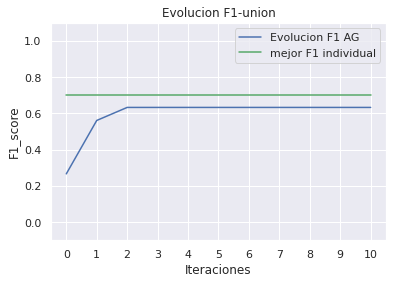

In [27]:
indice = np.arange(len(mejores_scores))
mejor_f1 = np.full(len(mejores_scores), MEJOR_MDE["f1_score"])

plt.xticks(indice, indice)
x = np.arange(len(mejores_scores)) 
y = mejores_scores
plt.ylim(-0.1, 1.1)
plt.ylabel("F1_score")
plt.xlabel("Iteraciones")
plt.title('Evolucion F1-union')
plt.plot(x, y, "b-", label='Evolucion F1 AG')
plt.legend()

# pinto mejor f1
x = np.arange(len(mejores_scores)) 
y = mejor_f1
plt.plot(x, y, "g-", label='mejor F1 individual')
plt.legend()
 
# Exporto png
plt.savefig('imagenes/resultados/f1score-union')

VP: 19
FP: 21
FN: 1
F1: 0.6333333333333334


[]

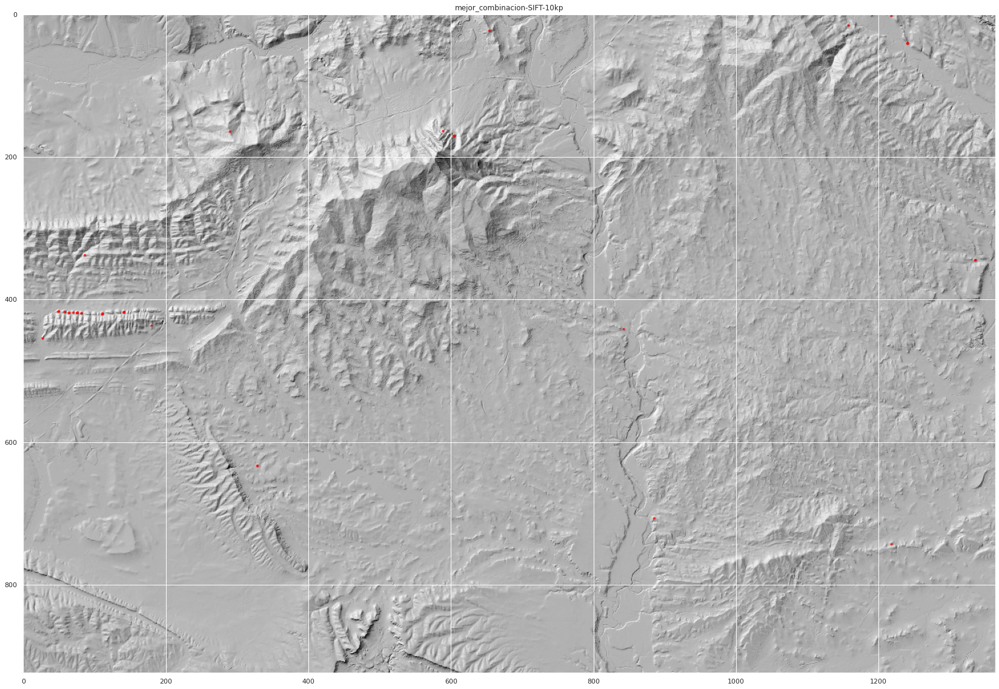

In [28]:
# Leo imagen
imagen = leeimagen('Small/Copia de MDT05-ETRS89-HU30-0172_Sombreado.tif', 0)

# Redimensiono
imagen = cv2.resize(imagen, (1364, 924))

VP = 0
FP = 0
FN = 0

# Positivos
for kp in mejor_combinacion["keypoints"]:
    coincide = False
    for kp_gt in SOLUCIONES_SIFT["ground_truth"]["keypoints"]:
        if (dentro_rango(kp,kp_gt) and not coincide):
            VP += 1
            coincide = True

    if not coincide:
        FP += 1

# Negativos
for kp_gt in SOLUCIONES_SIFT["ground_truth"]["keypoints"]:
    coincide = False
    for kp in mejor_combinacion["keypoints"]:
        if (dentro_rango(kp,kp_gt) and not coincide):
            coincide = True

    if not coincide:
        FN += 1

sensibilidad = VP / (VP+FN)
precision = VP / (VP+FP)
f1_score = f1(precision, sensibilidad)

print("VP:",VP)
print("FP:",FP)
print("FN:",FN)
print("F1:",f1_score)


# pinto keypoints
resultado = imagen.copy()
resultado = cv2.drawKeypoints(imagen, list(mejor_combinacion["keypoints"]), resultado, RED, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Muestro resultados
fig = plt.figure(figsize=(30,20))
ax = plt.subplot(1, 1, 1)
ax.set_title("mejor_combinacion-SIFT-" + str(NUM_KP) + "kp")
ax.imshow(resultado, cmap='gray')
ax.plot()

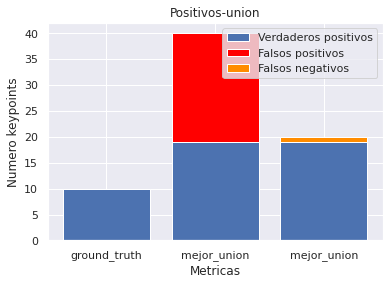

In [29]:
# POSITIVOS
verdaderos_positivos = [len(SOLUCIONES_SIFT["ground_truth"]["keypoints"]), VP, VP]
falsos_positivos = [0, FP, 0]
falsos_negativos = [0, 0, FN]

indice = np.arange(len(verdaderos_positivos)) 
# Se crean las primeras barras
plt.bar(indice, verdaderos_positivos, label='Verdaderos positivos')
 
# Se crean las segundas barras y se apilan sobre las primeras
plt.bar(indice, falsos_positivos, label='Falsos positivos',  bottom=verdaderos_positivos, color="red")
plt.bar(indice, falsos_negativos, label='Falsos negativos',  bottom=verdaderos_positivos, color="darkorange")
 
plt.xticks(indice, ["ground_truth", "mejor_union", "mejor_union"])
plt.ylabel("Numero keypoints")
plt.xlabel("Metricas")
plt.title('Positivos-union')
plt.legend()
 
# Exporto png
plt.savefig('imagenes/resultados/metadatos-union')

## Intersección de métricas

In [30]:
# APLICO EL ALGORITMO GENETICO

# Genero poblacion inicial
poblacion = generarPoblacionAleatoria(list(SOLUCIONES_SIFT.keys()), num_combinaciones=50, 
                                      min_metricas=1, max_metricas=len(SOLUCIONES_SIFT), modo="interseccion")

# Evaluo poblacion
poblacion, mejor_combinacion = evaluarPoblacion(poblacion, SOLUCIONES_SIFT, "interseccion")

print("mejor inicial".upper(),mejor_combinacion["f1_score"], "->" , len(mejor_combinacion["metricas"]))

mejores_scores = [mejor_combinacion["f1_score"]]
for _ in range(100):
    padres = seleccionarPadres(poblacion)
    
    hijos = generarHijos(padres)
        
    hijos = mutaciones(hijos, imagenes, mejor_combinacion) 
    
    poblacion, mejor_combinacion = reemplazo(hijos, mejor_combinacion, SOLUCIONES_SIFT, "interseccion")
    
    mejores_scores.append(mejor_combinacion["f1_score"])
    
    if((_+1) % 10 == 0):
        print(_+1, ":", mejor_combinacion["f1_score"], "->" ,  len(mejor_combinacion["metricas"]))
        
print("mejor_combinacion".upper(),mejor_combinacion["f1_score"], "->" , len(mejor_combinacion["metricas"]))
print(mejor_combinacion["metricas"])


MEJOR INICIAL 0 -> 1
10 : 0.41379310344827586 -> 2
20 : 0.7 -> 1
30 : 0.7 -> 1
40 : 0.7 -> 1
50 : 0.7 -> 1
60 : 0.7 -> 1
70 : 0.7 -> 1
80 : 0.7 -> 1
90 : 0.7 -> 1
100 : 0.7 -> 1
MEJOR_COMBINACION 0.7 -> 1
{'Upslope_Curvature_DEM05'}


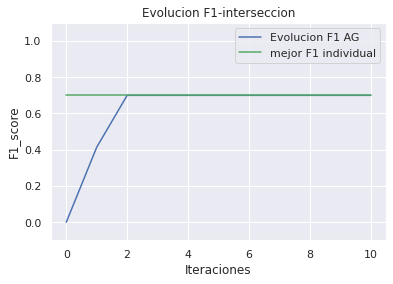

In [69]:
indice = np.arange(len(mejores_scores))
mejor_f1 = np.full(len(mejores_scores), MEJOR_MDE["f1_score"])

#plt.xticks(indice, indice)
x = np.arange(len(mejores_scores)) 
y = mejores_scores
plt.ylim(-0.1, 1.1)
plt.ylabel("F1_score")
plt.xlabel("Iteraciones")
plt.title('Evolucion F1-interseccion')
plt.plot(x, y, "b-", label='Evolucion F1 AG')
plt.legend()

# pinto mejor f1
x = np.arange(len(mejores_scores)) 
y = mejor_f1
plt.plot(x, y, "g-", label='mejor F1 individual')
plt.legend()
 
# Exporto png
plt.savefig('imagenes/resultados/f1score-interseccion')

VP: 7
FP: 3
FN: 3
F1: 0.7


[]

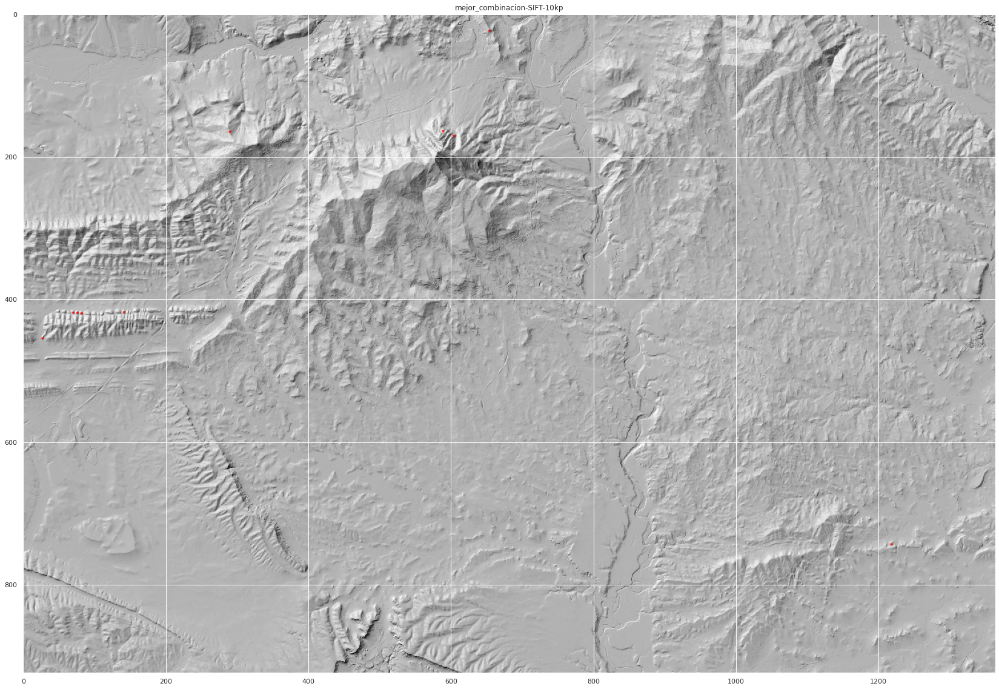

In [32]:
# Leo imagen
imagen = leeimagen('Small/Copia de MDT05-ETRS89-HU30-0172_Sombreado.tif', 0)

# Redimensiono
imagen = cv2.resize(imagen, (1364, 924))

VP = 0
FP = 0
FN = 0

# Positivos
for kp in mejor_combinacion["keypoints"]:
    coincide = False
    for kp_gt in SOLUCIONES_SIFT["ground_truth"]["keypoints"]:
        if (dentro_rango(kp,kp_gt) and not coincide):
            VP += 1
            coincide = True

    if not coincide:
        FP += 1

# Negativos
for kp_gt in SOLUCIONES_SIFT["ground_truth"]["keypoints"]:
    coincide = False
    for kp in mejor_combinacion["keypoints"]:
        if (dentro_rango(kp,kp_gt) and not coincide):
            coincide = True

    if not coincide:
        FN += 1

sensibilidad = VP / (VP+FN)
precision = VP / (VP+FP)
f1_score = f1(precision, sensibilidad)

print("VP:",VP)
print("FP:",FP)
print("FN:",FN)
print("F1:",f1_score)


# pinto keypoints
resultado = imagen.copy()
resultado = cv2.drawKeypoints(imagen, list(mejor_combinacion["keypoints"]), resultado, RED, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Muestro resultados
fig = plt.figure(figsize=(30,20))
ax = plt.subplot(1, 1, 1)
ax.set_title("mejor_combinacion-SIFT-" + str(NUM_KP) + "kp")
ax.imshow(resultado, cmap='gray')
ax.plot()

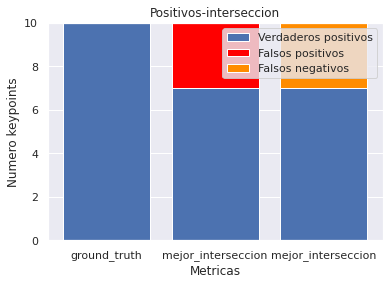

In [33]:
# POSITIVOS
verdaderos_positivos = [len(SOLUCIONES_SIFT["ground_truth"]["keypoints"]), VP, VP]
falsos_positivos = [0, FP, 0]
falsos_negativos = [0, 0, FN]



indice = np.arange(len(verdaderos_positivos)) 
# Se crean las primeras barras
plt.bar(indice, verdaderos_positivos, label='Verdaderos positivos')
 
# Se crean las segundas barras y se apilan sobre las primeras
plt.bar(indice, falsos_positivos, label='Falsos positivos',  bottom=verdaderos_positivos, color="red")
plt.bar(indice, falsos_negativos, label='Falsos negativos',  bottom=verdaderos_positivos, color="darkorange")
 
plt.xticks(indice, ["ground_truth", "mejor_interseccion", "mejor_interseccion"])
plt.ylabel("Numero keypoints")
plt.xlabel("Metricas")
plt.title('Positivos-interseccion')
plt.legend()
 
# Exporto png
plt.savefig('imagenes/resultados/metadatos-interseccion')

## Combina union/interseccion

In [58]:
# APLICO EL ALGORITMO GENETICO

# Genero poblacion inicial
poblacion = generarPoblacionAleatoria(list(SOLUCIONES_SIFT.keys()), num_combinaciones=50, 
                                      min_metricas=1, max_metricas=len(SOLUCIONES_SIFT), modo="union/interseccion")
    
# Evaluo poblacion
poblacion, mejor_combinacion = evaluarPoblacion(poblacion, SOLUCIONES_SIFT, "union/interseccion")

print("mejor inicial".upper(),mejor_combinacion["f1_score"], "->" , len(mejor_combinacion["metricas"]))
mejores_scores = [mejor_combinacion["f1_score"]]
for _ in range(100):
    padres = seleccionarPadres(poblacion)

    hijos = generarHijosArbol(padres)
        
    hijos = mutaciones(hijos, imagenes, mejor_combinacion, arbol=True) 
    
    poblacion, mejor_combinacion = reemplazo(hijos, mejor_combinacion, SOLUCIONES_SIFT, "union/interseccion")
    
    mejores_scores.append(mejor_combinacion["f1_score"])
    
    if((_+1) % 10 == 0):
        print(_+1, ":", mejor_combinacion["f1_score"], "->" ,  len(mejor_combinacion["metricas"]))
        
print("mejor_combinacion".upper(),mejor_combinacion["f1_score"], "->" , len(mejor_combinacion["metricas"]))
print(mejor_combinacion["arbol"])


MEJOR INICIAL 0.4666666666666667 -> 2
10 : 0.7 -> 5
20 : 0.7 -> 5
30 : 0.7 -> 5
40 : 0.7 -> 5
50 : 0.7 -> 5
60 : 0.7 -> 5
70 : 0.7 -> 5
80 : 0.7 -> 5
90 : 0.7 -> 5
100 : 0.7 -> 5
MEJOR_COMBINACION 0.7 -> 5
(Upslope_Curvature_DEM05 U ((Cross-Sectional_Curvature_MDE05 ∩ Horizontal-Overland-Flow-Distance_MDE05) U (Terrain_Ruggedness_Index_(TRI)_DEM05_1 ∩ TPI_MDT05_5_100_75)))


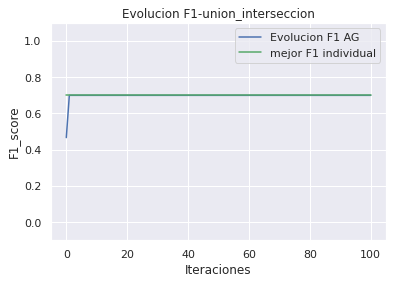

In [59]:
indice = np.arange(len(mejores_scores))
mejor_f1 = np.full(len(mejores_scores), MEJOR_MDE["f1_score"])

#plt.xticks(indice, indice)
x = np.arange(len(mejores_scores)) 
y = mejores_scores
plt.ylim(-0.1, 1.1)
plt.ylabel("F1_score")
plt.xlabel("Iteraciones")
plt.title('Evolucion F1-union_interseccion')
plt.plot(x, y, "b-", label='Evolucion F1 AG')
plt.legend()

# pinto mejor f1
x = np.arange(len(mejores_scores)) 
y = mejor_f1
plt.plot(x, y, "g-", label='mejor F1 individual')
plt.legend()
 
# Exporto png
plt.savefig('imagenes/resultados/f1score-union_interseccion')

VP: 7
FP: 3
FN: 3
F1: 0.7


[]

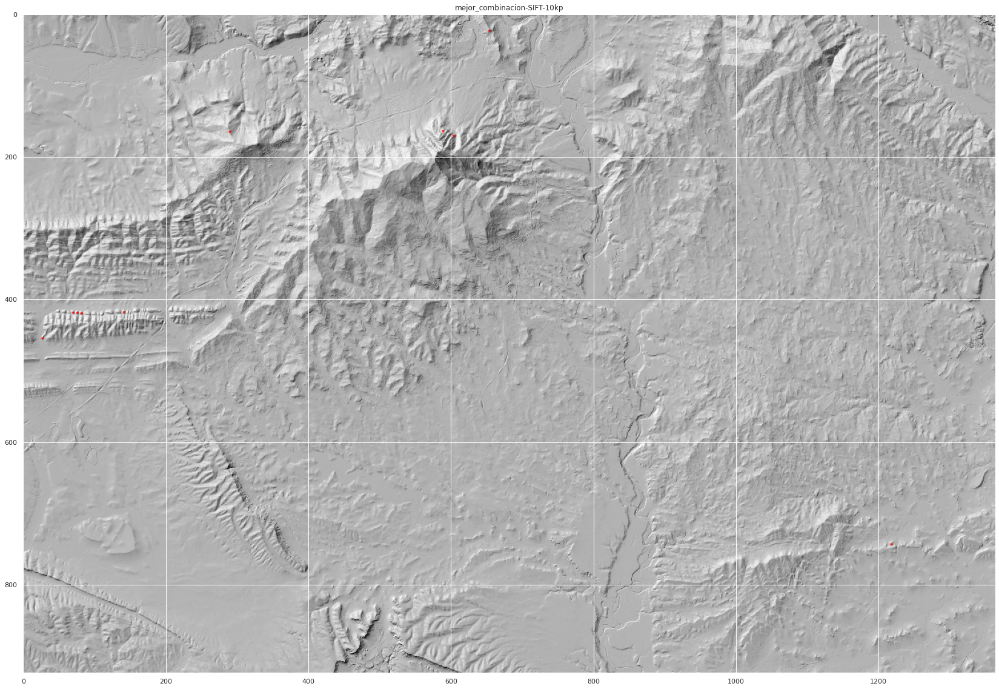

In [60]:
# Leo imagen
imagen = leeimagen('Small/Copia de MDT05-ETRS89-HU30-0172_Sombreado.tif', 0)

# Redimensiono
imagen = cv2.resize(imagen, (1364, 924))

VP = 0
FP = 0
FN = 0

# Positivos
for kp in mejor_combinacion["keypoints"]:
    coincide = False
    for kp_gt in SOLUCIONES_SIFT["ground_truth"]["keypoints"]:
        if (dentro_rango(kp,kp_gt) and not coincide):
            VP += 1
            coincide = True

    if not coincide:
        FP += 1

# Negativos
for kp_gt in SOLUCIONES_SIFT["ground_truth"]["keypoints"]:
    coincide = False
    for kp in mejor_combinacion["keypoints"]:
        if (dentro_rango(kp,kp_gt) and not coincide):
            coincide = True

    if not coincide:
        FN += 1

sensibilidad = VP / (VP+FN)
precision = VP / (VP+FP)
f1_score = f1(precision, sensibilidad)

print("VP:",VP)
print("FP:",FP)
print("FN:",FN)
print("F1:",f1_score)


# pinto keypoints
resultado = imagen.copy()
resultado = cv2.drawKeypoints(imagen, list(mejor_combinacion["keypoints"]), resultado, RED, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Muestro resultados
fig = plt.figure(figsize=(30,20))
ax = plt.subplot(1, 1, 1)
ax.set_title("mejor_combinacion-SIFT-" + str(NUM_KP) + "kp")
ax.imshow(resultado, cmap='gray')
ax.plot()

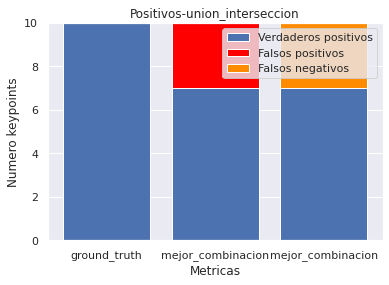

In [61]:
# POSITIVOS
verdaderos_positivos = [len(SOLUCIONES_SIFT["ground_truth"]["keypoints"]), VP, VP]
falsos_positivos = [0, FP, 0]
falsos_negativos = [0, 0, FN]

indice = np.arange(len(verdaderos_positivos)) 
# Se crean las primeras barras
plt.bar(indice, verdaderos_positivos, label='Verdaderos positivos')
 
# Se crean las segundas barras y se apilan sobre las primeras
plt.bar(indice, falsos_positivos, label='Falsos positivos',  bottom=verdaderos_positivos, color="red")
plt.bar(indice, falsos_negativos, label='Falsos negativos',  bottom=verdaderos_positivos, color="darkorange")
 
plt.xticks(indice, ["ground_truth", "mejor_combinacion", "mejor_combinacion"])
plt.ylabel("Numero keypoints")
plt.xlabel("Metricas")
plt.title('Positivos-union_interseccion')
plt.legend()
 
# Exporto png
plt.savefig('imagenes/resultados/metadatos-union_interseccion')